# Capstone Project - The Battle of the Neighborhoods 

## Table of contents
* [Introduction: Background](#background)
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

## Introduction: Background <a name = "background"></a>

[Washington D.C](https://en.wikipedia.org/wiki/Washington,_D.C.) is the political capital city of the [United States](https://en.wikipedia.org/wiki/United_States). It is one of the most popular tourist destinations in the world and annually receives more than 20 million visitors. As of July, 2018 the [U.S. Census Bureau](https://www.census.gov/quickfacts/DC) estimated more than 702,444 people live in the city.
[Washington D.C](https://en.wikipedia.org/wiki/Washington,_D.C.) has a diversified growing economy. Restaurant industry plays important role in the state's economy. According to [National Restaurant Association Report](https://restaurant.org/Downloads/PDFs/State-Statistics/dc.pdf), in 2018 the industry's estimated total sale was $4.4 billion with 2,447 eating and drinking locations in the District.

Due the facts Washington DC population is rising, number of workforce entering the city by day is expanding and among the visitors of the city most of them are internals might be the recipes for opening new American restaurant. Due to these and other facts stakeholders might be interested in opening American Restaurant in Washington DC.

## Introduction: Business Problem <a name="introduction"></a>

In this study three major tasks were conducted:
   1. Analysis of food venues distribution in Washington D.C
   2. Analysis of restaurants distribution in Washington D.C and
   3. Finding optimal locations for opening a new American restaurant.
   
In the first and second studies food venues and restaurants were analyzed lightly. While in the third study optimum locations for opening new American restaurants were identified. The criterion implemented to get optimum locations were:
* not populated with many restaurants
* close to the center of Washington D.C and
* no American restaurant exists in a certain distance range

Some of the algorithms and methods used in this work were adopted from **Capstone Project - The Battle of the Neighborhoods: Applied Data Science Capstone by IBM/Coursera**. In this study stakeholders who have intention to open restaurant specifically American restaurant in Washington D.C were targeted.

## Data <a name="data"></a>

Sources of data for this study were:
* [US Government's open data](https://catalog.data.gov/dataset/tiger-line-shapefile-2017-nation-u-s-current-state-and-equivalent-national): Geospatial data of the United States containing coordinates and shapes of states was obtained from an open data source portal of the US government. The complete geometry of Washington DC is required in order to generate neighborhood centers throughout Washington DC. We extracted the coordinates of the entire Washington DC geometry from the US shapely object file.  
* [OpenDataDC](https://opendata.dc.gov/): Data of 39 Neighborhood Clusters currently used by the District of Columbia for different purposes were retrieved. The geometry of the clusters was used to visualize food venues/restaurants distribution in Washington DC using folium map.
* Candidate neighborhoods data for Washington D.C was produced algorithmically. 
* [Foursquare](https://foursquare.com/): Food venues including type and geographical locations were retrieved by calling **[Foursquare](https://foursquare.com/) API**.
* [Mapbox](https://www.mapbox.com/): Approximate addresses of each neighborhoods were obtained by calling **[Mapbox](https://www.mapbox.com/) reverse geocoding API**.

Let's create operating system dependent function which makes directory,  handles URL requests, and save file into a directory.

In [1]:
import os                                # provides way of operating system dependent functionality
import urllib                            # url handling module
import requests                        

def get_data(dir, url, path):
    
    if not os.path.exists(dir):   # condition tested
        os.makedirs(dir)   # if the condition is false dir directory will be created
        print(dir,'directory was successfully created')
   
    else:
        print(dir, 'directory already exists!')
    
    # check if the file exists 
    if not os.path.isfile(path):
        urllib.request.urlretrieve(url, path) # download the file if condition is not satisfied
        print('Data was successfully downloaded')
        
    else:
        print("file exists")

### Neighborhood Candidates
Washington D.C. has 129 neighborhoods and 39 Clusters whose geographic coordinates can be easily retrieved from the city's government [OpenDataDC](https://opendata.dc.gov/) dataset portal. However these neighborhoods and clusters don't lend themselves for the analysis we intended to do. To serve our purpose  neighborhoods having equal size will be generated algorithmically throughout Washington D.C. Each neighborhood generated will be circular shape and equally sized.

Let's download US states shape file data including their geometry from [U.S shapefile](https://catalog.data.gov/dataset/tiger-line-shapefile-2017-nation-u-s-current-state-and-equivalent-national). Read the file to a geopandas GeoDataFrame object. From the GeoDataFrame object Washington DC information including geometry was extracted by testing some logical condition. 

In [5]:
# Installing dependecies for geospatial data manipulation and extracting geometries
!pip install geopandas                                # uncomment it if geopandas are already installed
import geopandas as gpd                                 # similar to pandas that handles geospatial data;           
from geopandas import GeoSeries                         # allows spatial operations on geometric data  
from shapely.geometry import Polygon, Point, box        # Manipulation and analysis of geometric objects in the Cartesian plane
import zipfile as zf

# Directory and file name
directory = './ShapeFile'                                                         # creating Data directory
url = 'https://www2.census.gov/geo/tiger/TIGER2017//STATE/tl_2017_us_state.zip'   # URL path to downlaod shape file
file_name = 'tl_2017_us_state.zip'                                                # name of .zip file
file_path = os.path.join(directory, file_name)                                    # path of the dataset file

# use the function get_data to download file into Data directory
get_data(directory, url, file_path)

# Extracting .zip file
with zf.ZipFile(file_path, 'r') as zp:                # opening the zip file in READ mode 
    zp.extractall(directory)                          # extracting all the files and save it into the directory
                                                    
# Saving shape file into GeoDataFrame 
file_location = os.path.join(directory, 'tl_2017_us_state.shp')            # U.S shape file
gdf = gpd.read_file(file_location)                                         # read it into GeoDataFrame 

dc_shape = gdf[gdf['STUSPS'] == 'DC'].reset_index(drop = True)            # Extracting Washington D.C from the geodataframe object 
dc_shape

./ShapeFile directory already exists!
file exists


,REGION,DIVISION,STATEFP,STATENS,GEOID,STUSPS,NAME,LSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,3,5,11,01702382,11,DC,District of Columbia,00,G4000,A,158351639,18675956,+38.9041031,-077.0172290,"POLYGON ((-77.11975 38.93435, -77.11886 38.935..."


Now we have the geometry of Washington D.C. Before we produce neighborhoods geography we need to construct a rectangular shape object having coordinates of minimum/maximum of Washington D.C coordinates. These coordinates were chosen because the rectangular object constructed using those coordinates will enclave the entire DC area. 
Furthermore we define the geometric centroid of the city as the center of the city. This will be used latter as reference point for calculating distance from each neighborhoods center.

In [6]:
# A function converting a geometric object to GeoDataFrame
def get_geodataframe(point):                                 
    crs = {'init': 'epsg:4326'}                              # 4326 is the EPSG identifier of WGS84 for geographic coordinate system
    gdf = gpd.GeoDataFrame(geometry = [point], crs = crs)    # crs: coordinate reference systesm
    return gdf

dc_center = [dc_shape.centroid.y.iloc[0],dc_shape.centroid.x.iloc[0]]  # Returns a GeoSeries of points for DC geometric centroid

minx = dc_shape.bounds.loc[0,'minx']                       # bounds is an attribute for Geoseries library and returns  
miny = dc_shape.bounds.loc[0,'miny']                       # tuple of max and min coordinates on each axis for each shape
maxx = dc_shape.bounds.loc[0,'maxx']
maxy = dc_shape.bounds.loc[0,'maxy']

b = box(minx,miny,maxx,maxy)              # a shapely.geometry function used for constructing rectangular object                                                          
gdf_box = get_geodataframe(b)             # converting a shapely object to a GeoDataFrame             

Let's draw the map of Washington D.C. together with the rectangular objected constructed above. 

In [47]:
!conda install -c conda-forge folium --yes              # some features of folium map used in this project are only available from the latest version of folium
import folium

map_dc = folium.Map(location=dc_center, zoom_start=11)

folium.Marker(dc_center, popup = 'Centroid of DC').add_to(map_dc)
folium.GeoJson(dc_shape.geometry).add_to(map_dc)
folium.GeoJson(gdf_box.geometry).add_to(map_dc)

map_dc.save(os.path.join('Results', 'image-1.html'))

map_dc

So far all looks good. Now let's generate equally sized grids of area in the entire rectangular object. Each grid object defines neighborhoods having radius of 300 meters. Each adjacent neighborhoods centers will be 600 meters apart. To accurately calculate distances we need to create our candidate neighborhoods in Cartesian 2D coordinate system. Then we'll project those coordinates back to latitude/longitude degrees to be shown on Folium map. So let's create functions to convert between WGS84 spherical coordinate system (latitude/longitude degrees) and UTM Cartesian coordinate system (X/Y coordinates in  meters).

In [8]:
import pyproj
import numpy as np
from shapely.geometry import Point, Polygon, box

def lonlat_to_xy(lon, lat):
    proj_latlon = pyproj.Proj(proj='latlong',datum='WGS84')
    proj_xy = pyproj.Proj(proj="utm", zone=18, datum='WGS84')   # Washington D.C. is found in zone 18
    xy = pyproj.transform(proj_latlon, proj_xy, lon, lat)
    return xy[0], xy[1]

def xy_to_lonlat(x, y):
    proj_latlon = pyproj.Proj(proj='latlong',datum='WGS84')
    proj_xy = pyproj.Proj(proj="utm", zone=18, datum='WGS84')
    lonlat = pyproj.transform(proj_xy, proj_latlon, x, y)
    return lonlat[0], lonlat[1]

def calc_xy_distance(x1, y1, x2, y2):
    dx = x2 - x1
    dy = y2 - y1
    return np.sqrt(dx*dx + dy*dy)

Below we create candidate neighborhoods (area grids).

In [9]:
# corners of rectangle to be transformed to a grid
stepsize = 600         # grid step size

from shapely.geometry import Point
import pandas as pd

# Project corners to target projection
south_bound = lonlat_to_xy(minx, miny)
east_bound = lonlat_to_xy(maxx, maxy)

# Iterate over 2D area
gridpoints = []
x = south_bound[0]
while x < east_bound[0]:
    y = south_bound[1]
    while y < east_bound[1]:
        p = Point(xy_to_lonlat(x, y))
        gridpoints.append(p)
        y += stepsize
    x += stepsize

df_grid = pd.DataFrame([(grid.y, grid.x) for grid in gridpoints])
df_grid.columns = ['Latitude','Longitude']

print(df_grid.shape[0], 'neighborhood centers generated.')

1216 neighborhood centers generated.


In [10]:
import folium
dc_map = folium.Map(location=dc_center, zoom_start=12)

folium.GeoJson(dc_shape.geometry).add_to(dc_map)
folium.GeoJson(gdf_box.geometry).add_to(dc_map)

for lat,lng in zip(df_grid.Latitude, df_grid.Longitude):
    folium.CircleMarker([lat,lng], radius = 2, color = 'red').add_to(dc_map)

dc_map.save(os.path.join('Results', 'image-2.html'))
    
dc_map

The red dotted objects in the folium map are the area grids produced. However we are not interested in all of the grids generated. We need only those grids which are contained inside Washington D.C. map. To obtain all the neighborhoods that are inside Washington DC we need to test a condition and select out the grids meet the testing criteria. We use .within() shapely method which is found in the geopandas geoseries geometric manipulation library. The method is illustrated in the cell below.

In [11]:
grid_points = [Point(x, y) for x,y in zip(df_grid.Longitude, df_grid.Latitude)]     # Creating shapely point for centers of each neighborhood
dc_interiors = [(get_geodataframe(grid)) for grid in grid_points if (get_geodataframe(grid).within(dc_shape))[0]]  # Obtaining all the neighborhoods that are 
dc_neighborhoods = [(point['geometry'].y[0],point['geometry'].x[0]) for point in dc_interiors]                     # inside Washington DC

df_dc = pd.DataFrame(dc_neighborhoods)
df_dc.columns = ['Latitude','Longitude']
print(df_dc.shape[0],'neighborhoods were obtained')

for grids in dc_neighborhoods:
    folium.CircleMarker(grids, radius = 2, color = 'blue').add_to(dc_map)

dc_map.save(os.path.join('Results', 'image-3.html'))
    
dc_map

496 neighborhoods were obtained


Of all the 1216 grids (dotted red) produced only 496 (dotted blue) have satisfied the test condition. So we take these 496 as candidates of neighborhoods for further analysis. The grids selected are shown in blue dots above in the folium map. 

In [12]:
import folium
dc_m = folium.Map(location=dc_center, zoom_start=13)

folium.GeoJson(dc_shape.geometry).add_to(dc_m)

for grids in dc_neighborhoods:
    folium.Circle(grids, radius = 300, color = 'green').add_to(dc_m)
    
dc_m.save(os.path.join('Results', 'image-4.html'))
    
dc_m

As shown above in the folium map each neighborhood are circular in shape and have same size. The next step will be finding the address of each neighborhood center. We use **Mapbox reverse geocoding** to obtain addresses

In [14]:
token = 'pk.eyJ1IjoidGVkeWplIiwiYSI6ImNrMzk0a2tkaDBjdzEzY3BlYmc2cHpwcnMifQ.vKH-5mOvsbHfmhtGuChu6Q'   # Mapbox key

In [16]:
# function to find addresses
!pip install geocoder              # uncomment it if you haven't installed gecoder module before
import geocoder
import json
import pickle

def get_address(key, lat, lng):
    try:
        response = geocoder.mapbox([lat, lng], method='reverse',key = token).json
        address = response['address']
        return address
    except:
        None
        
def get_neighborhood_addresse(lats,lngs):
    print('Obtaining location addresses: ', end='')
    addresses = []
    for lat, lon in zip(lats,lngs):
        address = get_address(token, lat, lon)
        if address is None:
            address = 'NO ADDRESS'
        address = address.replace(', United States', '') # We don't need country part of address
        addresses.append(address)
        print(' .', end='')
    print(' done.')
    return addresses    

lats = df_dc.Latitude
lngs = df_dc.Longitude
loaded = False

try:
    with open(os.path.join('./Data', 'dcAddresses.pkl'), 'br') as k:
        addresses = pickle.load(k)
        print('Addresses data loaded.')
        loaded = True
except:
    pass

if not loaded:
    addresses = get_neighborhood_addresse(lats,lngs)
    with open(os.path.join('./Data', 'dcAddresses.pkl'), 'wb') as m:
        pickle.dump(addresses, m)      

Addresses data loaded.


In [17]:
# let's calculate the distance between DC centroid and centers of each neighborhood generated

df_dc['Address'] = addresses

dc_x, dc_y = lonlat_to_xy(dc_center[1], dc_center[0])
latlon_array = df_dc[['Longitude','Latitude']].to_numpy()
x, y = lonlat_to_xy(latlon_array[:,0],latlon_array[:,1])

df_dc['X'] = x
df_dc['Y'] = y

Distance = calc_xy_distance(x, y, dc_x, dc_y)
df_dc['Distance from Center'] = Distance

df_dc = df_dc[['Address','Latitude','Longitude','X','Y','Distance from Center']]
df_dc.to_pickle(os.path.join('./Data', 'dc_adresses.pkl')) 

df_dc.head()

,Address,Latitude,Longitude,X,Y,Distance from Center
0,"201 Chain Bridge Road, Washington, District of...",38.932255,-77.117018,316500.112287,4.311390e+06,9252.040492
1,"5411 Potomac Avenue Northwest, Washington, Dis...",38.926977,-77.109940,317100.112287,4.310790e+06,8486.865817
2,"5701 Sherier Place Northwest, Washington, Dist...",38.932380,-77.110101,317100.112287,4.311390e+06,8692.778496
3,"5220 Little Falls Road Northwest, Washington, ...",38.937783,-77.110261,317100.112287,4.311990e+06,8934.310525
4,"Potomac Heritage Trail, Washington, District o...",38.916295,-77.102704,317700.112287,4.309590e+06,7602.369562


## Four Square

Now we have all the information needed about the neighborhoods. The next step will be obtaining food venues located in each neighborhood. However to analyze the results returned by [Foursquare](https://foursquare.com/) API it is important to understand how food venues are categorized hierarchically in foursquare database. 

In general venues in four square dataset are categorized hierarchically. To mention some of the [Venue Categories](https://developer.foursquare.com/docs/resources/categories) on the highest level of the hierarchy: "Arts & Entertainment", "College & University", "Event", and "Food". However in this work our focus will be only on **Food Venues** which has category ID of '4d4b7105d754a06374d81259'. In the hierarchy of food venue there are 91 categories (Asian, African, American ...). Among the 91 categories 21 of them have specific categories and  placed on the next level of the hierarchy. For example Asia restaurant was classified on the top of the food venue hierarchy with the next hierarchy contains China, Burmese, Cambodian and other 13 restaurants. Furthermore on the hierarchy of China restaurant there are 31 categories such as Anhui, Beijing and 29 more restaurants each having unique category ID. 

When we call [Foursquare](https://foursquare.com/) food venues API, each venues result fall exclusively in either of the hierarchical categories explained above (for instance either Asian, or Chinese, or Beijing restaurant category not both).

On the next cell we call API from foursquare to retrieve data of [**Foursquare Venue Category Hierarchy**](https://developer.foursquare.com/docs/resources/categories) in JSON format

In [18]:
import pandas as pd
import numpy as np
import requests

# client id and secret for foursquare
data_dir = './Data'
client_id = 'OBSBK55IXGERWWDE0GJW4KRYZKYQQK4HNHOXETLSLRWZTBCZ' # your Foursquare ID
client_secret = 'NS1GBSCRHNEUETT5DMH51TYBVYEJTY3AHGGQYJEDCNRYOS2V' # your Foursquare Secret
version = '20180604'

url = 'https://api.foursquare.com/v2/venues/categories?client_id={}&client_secret={}&v={}'.format(client_id, client_secret,version)
results = requests.get(url).json()

food_category = results['response']['categories'][3]['id']
venue_category = results['response']['categories'][3]['categories']

df_category = pd.DataFrame([(category['id'],category['name']) for category in venue_category])
df_category.columns = ['categoryID', 'categoryName']

df_category.to_pickle(os.path.join('./Data', 'category.pkl'))     

print(df_category.shape)

(91, 2)


In [19]:
subcategories = []

for categories in venue_category:
    if categories['categories']:
        subCat = [(category['id'],category['name'],categories['id'])for category in categories['categories']] 
        subcategories.append(subCat)
        
df_subcategory = pd.DataFrame([item for venue_list in subcategories for item in venue_list])
df_subcategory.columns = ['subcategoryID','categoryName','categoryID']
df_subcategory.to_pickle(os.path.join(data_dir, 'subcategory.pkl'))

print(df_subcategory.shape)

(165, 3)


In [20]:
specificCategories = []

for categories in venue_category:
    if categories['categories']:
        for category in categories['categories']:
            if category['categories']:
                subCat = [(specifics['id'],specifics['name'],category['id'])for specifics in category['categories']] 
                specificCategories.append(subCat)
    
df_specific = pd.DataFrame([item for specific in specificCategories for item in specific])
df_specific.columns = ['specificID','categoryName','subcategoryID']

df_specific.to_pickle(os.path.join(data_dir, 'specificVenues.pkl'))

print(df_specific.shape)

(78, 3)


Now we have obtained food venue categories and saved them into pandas dataframe. We need these data latter when we analyze specific restaurants. At this step we continue exploiting four square API in order to get food venues data in each neighborhood

In [21]:
def get_categories(categories):
    return [(cat['name'], cat['id']) for cat in categories]

def format_address(location):
    address = ', '.join(location['formattedAddress'])
    address = address.replace(', Washington', '')
    address = address.replace(', United States', '')
    return address

def get_venues_near_location(lat, lon, category, client_id, client_secret, radius=340, limit=100):
    version = '20180724'
    url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(client_id, 
                                                                                                                                             client_secret, version, 
                                                                                                                                             lat, lon, category, radius, 
                                                                                                                                             limit)
    try:
        results = requests.get(url).json()['response']['groups'][0]['items']
        venues = [(item['venue']['id'],
                   item['venue']['name'],
                   get_categories(item['venue']['categories']),
                   (item['venue']['location']['lat'], item['venue']['location']['lng']),
                   format_address(item['venue']['location']),
                   item['venue']['location']['distance']) for item in results]        
    except:
        venues = []
    return venues

def get_foodvenues(lats,lngs,addr):
    
    print('Obtaining venues around candidate locations:', end='')
    
    for lat,lng,add in zip(lats,lngs,addr):
        venues = get_venues_near_location(lat, lng, food_category, client_id, client_secret, radius=340, limit=100)
        
        venues = [(add, venue[0],venue[1],venue[2][0][0],venue[2][0][1], venue[3][0],
                   venue[3][1],venue[4],venue[4]) for venue in venues if city in venue[4]]
        
        food_venues.append(venues)
        print(' .', end='')
   
    df_food_venues = pd.DataFrame([item for venues in food_venues for item in venues])
    df_food_venues.columns = ['Neighborhood Center','venueID','venueName','categoryName','categoryID','Latitude','Longitude','Address','distanceFromCenter']

    df_food_venues = pd.concat(group.sort_values('distanceFromCenter') for _, group in df_food_venues.groupby('venueID'))
    df_foodVenues = df_food_venues.drop_duplicates(subset = 'venueID', keep = 'first').reset_index(drop = True)
    
    print(' done.')
    
    return df_food_venues, df_foodVenues

We already have created functions which are necessary for retrieving data from foursquare. Next we will call these functions to get food venues data.

In [22]:
import pickle
import os

lats = df_dc['Latitude']
lngs = df_dc['Longitude']
addr = df_dc['Address']

food_venues = []
city = 'D.C.'

loaded = False

try:
    with open(os.path.join('./Data','foodVenues.pkl'), 'br') as m:
        df_foodVenues = pickle.load(m)
    with open(os.path.join('./Data','grossFoodVenues.pkl'), 'br') as n:
        df_food_venues = pickle.load(n)
    
    loaded = True
except:
    pass

# If load failed use the Foursquare API to get the data
if not loaded:
    
    df_food_venues, df_foodVenues = get_foodvenues(lats, lngs,addr)
    
    # Let's persists this in local file system
    with open(os.path.join(data_dir, 'grossFoodVenues.pkl'), 'wb') as m:
        pickle.dump(df_food_venues, m)
    with open(os.path.join(data_dir, 'foodVenues.pkl'), 'wb') as n:
        pickle.dump(df_foodVenues, n)

df_food_venues.shape

(2537, 9)

## Methodology <a name="methodology"></a>

The methodology used here is more or less adopted from  **Capstone Project - The Battle of the Neighborhoods: Applied Data Science Capstone by IBM/Coursera**. In this project our main focus will be identifying potential locations(neighborhoods) in Washington DC for opening American restaurant. The selected locations are mainly characterized by their proximity (2000 meter range of radius) to the center of Washington D.C. Moreover there shouldn't be any American restaurant within 250 meters of radius. And finally no more than two restaurants should exist within 400 meter radius range from their respective center.

In this work four major tasks were conducted. The first task was collecting food venues data throughout Washington DC. During this stage food venues data was generated by calling foursquare API and saved into dataframe.

While in the second stage the dataframe obtained from the first step was manipulated and restaurant dataframe was created. Both food venue and restaurant dataframes were grouped categorically and the results were visualized using bar plot. The most common restaurant venue (American restaurant) will be considered for the next stage analysis.

During the third step the restaurant selected out in the previous stage (i.e American restaurant) will be analyzed. In this analysis area distribution of this restaurant will be visualized using heat map. Again density of restaurants over Washington D.C will be visualized using heat map. Furthermore neighborhoods throughout Washington DC will be analyzed in terms of how far they are from the closest American restaurant and number of restaurants available in each of them.

In fourth and final step we will focus on most promising areas and within those create **clusters of locations that meet some basic requirements** established in discussion with stakeholders: we will take into consideration locations with **no more than two restaurants in radius of 250 meters**, and we want locations **without American restaurants in radius of 400 meters**. We will present map of all such locations but also create clusters (using **k-means clustering**) of those locations to identify general zones / neighborhoods / addresses which should be a starting point for final 'street level' exploration and search for optimal venue location by stakeholders.

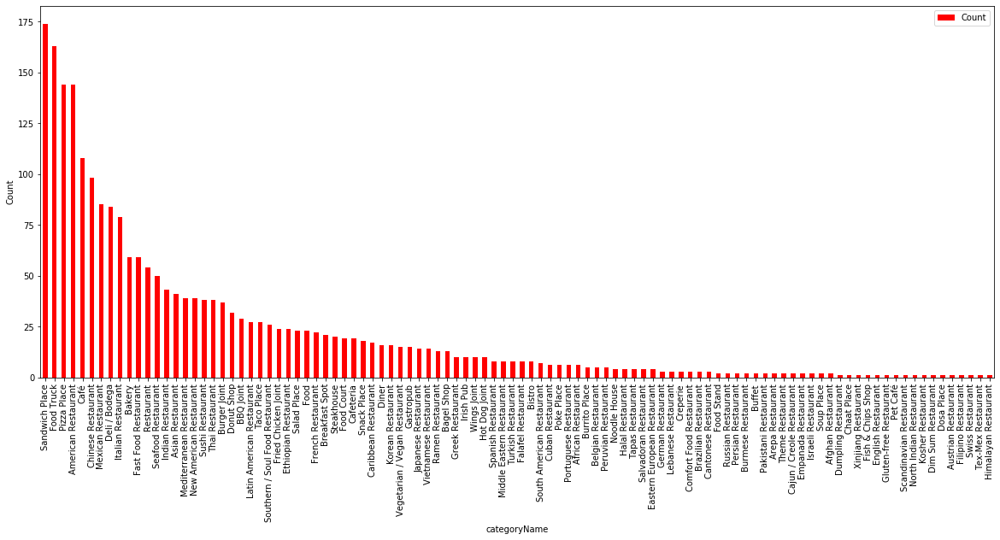

In [23]:
import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline 

# Grouing function
def grouping(df, grouping_column, col_name,verbose = False):
    
    if verbose:
        df_ = pd.DataFrame(df[grouping_column].value_counts()).reset_index()
        df_.columns =  [grouping_column, col_name]
    else:
        df_ = pd.DataFrame(df[grouping_column].value_counts())
        df_.index.rename(df_.columns[0], inplace = True)
        df_.columns =  [col_name]
                
    return df_

def plot_bar(df_group,figsize, color):
    
    fig = plt.figure(figsize = figsize)
    ax = fig.add_subplot(111)
    
    df_group.plot(kind = 'bar', color = color, ax = ax)
    plt.xticks(rotation='vertical')

    ax.set_xlabel('categoryName')
    ax.set_ylabel('Count')
    plt.show()
    

# Let's count each venue category using the above function. And plot the results and see how the distribution looks
df_count = grouping(df_foodVenues,'categoryName','Count')
plot_bar(df_count, (20,8), 'red')

As it can be seen from the bar plot Sandwich Place is the number one most populated food venue in Washington DC and followed by food truck, American restaurant and Pizza place. The diversity of Washington DC is quite reflected in its restaurants. The restaurants variety ranges from South America to Asia and from Africa to Europe spanning all over the entire world. Among the exotic restaurants Chinese restaurant is the most common and followed by Mexican, Italian and Indian restaurants. By far American restaurants are the most populated restaurants in DC. Italian restaurants are the leading in number among the European restaurants. Apparently Ethiopian restaurant are the only establishment from African continent. 

Let's modify food venues data to include only restaurants, dinner, taverna and stakehouse categories as the other categories are not proper restaurants.

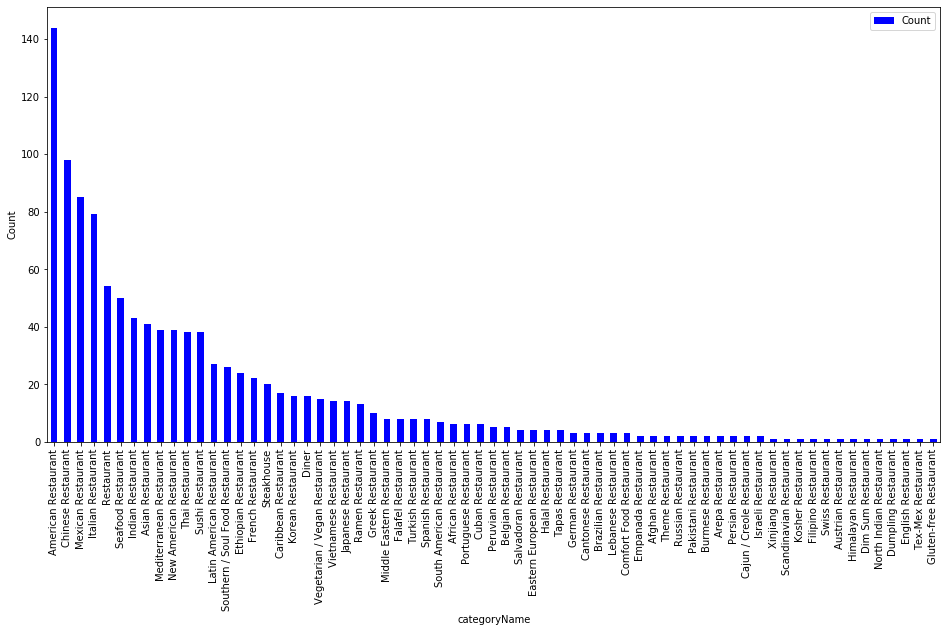

In [24]:
pd.options.mode.chained_assignment = None

# filtering out restaurants from food venues dataframe

restaurant_words = ['restaurant', 'diner', 'taverna', 'steakhouse']
fast_food = 'fast food'
rest_cat = []

for _, foodVenue in df_foodVenues.iterrows():                        # iterating all over food venues data to detect only 
    test = foodVenue['categoryName']                                 # venues satisfying the set criteria
    if not fast_food in test.lower():
        for r in restaurant_words:
            if r in test.lower():
                rest_cat.append(test)
df_restaurant = df_foodVenues[df_foodVenues['categoryName'].isin(rest_cat)]

restaurants_latlon_array = df_restaurant[['Longitude','Latitude']].to_numpy()               # creating numpy array from df_restaurant dataframe
xrest, yrest = lonlat_to_xy(restaurants_latlon_array[:,0], restaurants_latlon_array[:,1])   # converting spherical coordinate to plannar 2D coordinate

df_restaurant['X'] = xrest
df_restaurant['Y'] = yrest

df_restaurant_counts = grouping(df_restaurant, 'categoryName', 'Count')          # grouping the result restaurant data according to their type
plot_bar(df_restaurant_counts, (16,8), 'blue')                                   # plot the result to a bar plot diagram

Among the restaurants American restaurant is the number one most populated restaurant in Washington DC and followed by Chinese restaurant. Where as Mexican and Italian restaurants trailed third and fourth. However the number of restaurant venues of each category might goes up as subcategories of some restaurants were considered independently. For instance New American Restaurant is considered independently as shown above in the map, although it is under the category of American restaurant. Latter when we do area/location analysis of American restaurants we will merge both together subtly. 

In the next cell we will determine the number of restaurants found in each candidate neighborhood

In [25]:
# obtaining number of restaurants in each neighborhood
neighborhood_grouped = grouping(df_restaurant, 'Neighborhood Center', 'Count', True)

# merging the above data frame with neighborhood dataframe
merged = pd.merge(df_dc, 
         neighborhood_grouped,
         left_on = 'Address',
         right_on = 'Neighborhood Center',
         how = 'left'
        )

merged.drop('Neighborhood Center', axis = 1, inplace = True)
merged['Count'].fillna(0, inplace = True)
merged.head()

,Address,Latitude,Longitude,X,Y,Distance from Center,Count
0,"201 Chain Bridge Road, Washington, District of...",38.932255,-77.117018,316500.112287,4.311390e+06,9252.040492,0.0
1,"5411 Potomac Avenue Northwest, Washington, Dis...",38.926977,-77.109940,317100.112287,4.310790e+06,8486.865817,0.0
2,"5701 Sherier Place Northwest, Washington, Dist...",38.932380,-77.110101,317100.112287,4.311390e+06,8692.778496,0.0
3,"5220 Little Falls Road Northwest, Washington, ...",38.937783,-77.110261,317100.112287,4.311990e+06,8934.310525,0.0
4,"Potomac Heritage Trail, Washington, District o...",38.916295,-77.102704,317700.112287,4.309590e+06,7602.369562,0.0


In the next cell we try to obtain the top four restaurants by considering subcategories of each categories. We make use of the category/subcategory dataframe we have produced previously by using foursquare API.

In [26]:
# Function that accepts restaurant type(country_restaurant) and logical values for hierarchies (first_category and second_category) 
# and returns a dataframe of specific restaurant category

# first_category refers lower hierarchies of food venues categories
# second_category refers the lowest hierarchy of food venues categories
# when first_category is true the function considers df_category and df_subcateogry while second_category is true 
# the function considers df_subcategory and df_specific

# df_category dataframe represetnts the heighest hierarchy of food venues
# df_subcategory dataframe represents the lower hierarchy of food venues
# df_specifics represent the lowest hierarchy of food venues


def get_country_restaurants(country_restaurant, first_category = False, second_category = False, verbose = False):
    if first_category:
        country_category_id = df_category[df_category['categoryName'] == country_restaurant]['categoryID'].values.tolist()
        country_subcategory_id = df_subcategory[df_subcategory['categoryID'] == country_category_id[0]]['subcategoryID'].values.tolist()
        country_categories = country_category_id + country_subcategory_id
        
        df_country_restaurants = df_restaurant[df_restaurant['categoryID'].isin(country_categories)]
        
    if second_category:
        country_category_id = df_subcategory[df_subcategory['categoryName'] == country_restaurant]['subcategoryID'].values.tolist()
        country_subcategory_id = df_specific[df_specific['subcategoryID'] == country_category_id[0]]['specificID'].values.tolist()
        country_categories = country_category_id + country_subcategory_id
        
        df_country_restaurants = df_restaurant[df_restaurant['categoryID'].isin(country_categories)]
    if verbose:
        return df_country_restaurants,country_categories
    else:
        return df_country_restaurants
    
top_4 = ['American Restaurant',
         'Chinese Restaurant',
         'Mexican Restaurant',
         'Italian Restaurant']

american_restaurant = get_country_restaurants(top_4[0], first_category = True)
italian_restaurant = get_country_restaurants(top_4[3], first_category = True)
mexican_restaurant = get_country_restaurants(top_4[2], first_category = True)
chinese_restaurant = get_country_restaurants(top_4[1], second_category = True)

print('There are {}, {}, {} and {} American, Italian, Mexican and Chinese restaurants respectively'.format(american_restaurant.shape[0],
                                                                                           italian_restaurant.shape[0],
                                                                                           mexican_restaurant.shape[0],
                                                                                           chinese_restaurant.shape[0]))

There are 183, 79, 86 and 103 American, Italian, Mexican and Chinese restaurants respectively


After we considered subcategories of American restaurant the number has increased from 144 to 183. Similarly number of Chinese restaurants increased from 98 to 103. 

In [27]:
print('American restaurants represent {:,.2f} percent of the total restaurants venues'.format(np.array(american_restaurant.shape[0]/df_restaurant.shape[0])*100))

American restaurants represent 16.44 percent of the total restaurants venues


That looks great. Now let's select American restaurant and calculate the average distance of any American restaurant from the center of each neighborhoods. 

In [28]:
american_latlon_array = american_restaurant[['Longitude','Latitude']].to_numpy()
xr, yr = lonlat_to_xy(american_latlon_array[:,0], american_latlon_array[:,1])

american_restaurant['x'] = xr
american_restaurant['y'] = yr

distances_to_american_restaurant = []

for _,row in df_dc.iterrows():
    min_distance = 2000
    
    for _,res in american_restaurant.iterrows():
        res_x = res['x']
        res_y = res['y']
        
        d = calc_xy_distance(row['X'], row['Y'], res_x, res_y)
        if d<min_distance:
            min_distance = d
    distances_to_american_restaurant.append(min_distance)

merged['Distance to American restaurant'] = distances_to_american_restaurant
merged.sort_values(by = ['Count'], ascending = False).head()

,Address,Latitude,Longitude,X,Y,Distance from Center,Count,Distance to American restaurant
243,"555 Mass Rooftop Deck, 555 Massachusetts Ave N...",38.901550,-77.019247,324900.112287,4.307790e+06,439.590443,43.0,60.558519
110,"9 Hillyer Court Northwest, Washington, Distric...",38.911876,-77.047217,322500.112287,4.308990e+06,2794.937221,36.0,463.798150
175,"1445 I Street Northwest, Washington, District ...",38.901310,-77.033077,323700.112287,4.307790e+06,1504.975193,29.0,124.512456
142,"1748 Euclid Street Northwest, Washington, Dist...",38.922804,-77.040611,323100.112287,4.310190e+06,2907.031466,27.0,101.335931
213,"2021 11th Street Northwest, Washington, Distri...",38.917641,-77.026623,324300.112287,4.309590e+06,1685.708987,26.0,181.985537


The next step will be visualizing restaurants distribution in Washington DC using folium heat map

In [29]:
# Washington DC Clusters data
dc_geojson_data = os.path.join('./Data','dc_neighborhoods.json')
with open(dc_geojson_data) as json_file:
    data_geojson_dict = json.load(json_file)

In [30]:
from folium import plugins
from folium.plugins import HeatMap

m = folium.Map(location=dc_center, zoom_start=13)
folium.TileLayer('cartodbpositron').add_to(m) #cartodbpositron cartodbdark_matter

rest_latlon = df_restaurant[['Latitude','Longitude']].values.tolist()

HeatMap(rest_latlon).add_to(m)
folium.Marker(dc_center).add_to(m)
folium.Circle(dc_center, radius=1000, fill=False, color='white').add_to(m)
folium.Circle(dc_center, radius=2000, fill=False, color='white').add_to(m)
folium.Circle(dc_center, radius=3000, fill=False, color='white').add_to(m)
folium.Circle(dc_center, radius=4000, fill=False, color='white').add_to(m)

layer_geom = folium.FeatureGroup(name='layer',control=True)

for i in range(len(data_geojson_dict["features"])):
    temp_geojson = {"features":[data_geojson_dict["features"][i]],"type":"FeatureCollection"}

    
    temp_geojson_layer = folium.GeoJson(temp_geojson,
                   highlight_function=lambda x: {'weight':3, 'color':'red'},
                    control=False,
                    style_function=lambda feature: {
                   'color': 'black',
                   'weight': 1},
                    tooltip=folium.features.GeoJsonTooltip(fields=['NAME','NBH_NAMES'],
                                                           aliases=['Cluster','Neighborhoods'], 
                                                           labels=True, 
                                                           sticky=True))
    temp_geojson_layer.add_to(layer_geom)

layer_geom.add_to(m)

folium.LayerControl(autoZIndex=False, collapsed=True).add_to(m)

m.save(os.path.join('Results', 'image-5.html'))

m

As shown above in the heat map most of the restaurants are distributed with in 4000 meters of the centroid. Areas of highest density of restaurants are West, North West and South West of Washington DC. In fact most of the restaurants are found in Cluster 1,2 3, 4, 5, 6, 7 and 8. The neighborhoods in each cluster can be seen in the above interactive folium map.

In [31]:
from folium import plugins
from folium.plugins import HeatMap

dc_map = folium.Map(location=dc_center, zoom_start=12.5)
folium.TileLayer('cartodbpositron').add_to(dc_map) #cartodbpositron cartodbdark_matter

am_rest_latlon = american_restaurant[['Latitude','Longitude']].values.tolist()

HeatMap(am_rest_latlon).add_to(dc_map)
folium.Marker(dc_center).add_to(dc_map)
folium.Circle(dc_center, radius=1000, fill=False, color='white').add_to(dc_map)
folium.Circle(dc_center, radius=2000, fill=False, color='white').add_to(dc_map)
folium.Circle(dc_center, radius=3000, fill=False, color='white').add_to(dc_map)
folium.Circle(dc_center, radius=4000, fill=False, color='white').add_to(dc_map)

layer_geom = folium.FeatureGroup(name='layer',control=True)

for i in range(len(data_geojson_dict["features"])):
    temp_geojson = {"features":[data_geojson_dict["features"][i]],"type":"FeatureCollection"}
    temp_geojson_layer = folium.GeoJson(temp_geojson,
                   highlight_function=lambda x: {'weight':3, 'color':'blue'},
                    control=False,
                    style_function=lambda feature: {
                   'color': 'black',
                   'weight': 1},
                    tooltip=folium.features.GeoJsonTooltip(fields=['NAME','NBH_NAMES'],
                                                           aliases=['Cluster','Neighborhoods'], 
                                                           labels=True, 
                                                           sticky=True))
    temp_geojson_layer.add_to(layer_geom)

layer_geom.add_to(dc_map)
folium.LayerControl(autoZIndex=False, collapsed=True).add_to(dc_map)

dc_map.save(os.path.join('Results', 'image-6.html'))

dc_map

American restaurant represents less than 16.5 percent of the total restaurants. It is evident from the map above the density of American restaurants is low.

From restaurant heat map low concentration of restaurants observed along east, north east and south east areas. Most of restaurant activities are limited within 4000 meters distance range from the center. Most of tourist attracting sites including White House, Museums, and U.S. Capitol are located close to the center of Washington DC. So we limit detecting optimum location for opening American restaurant within certain radius from the center. Let's assume 2000 meters radius range from the center and look for optimum locations within that satisfy the conditions mentioned before. 

Doing so first let's generate and define new neighborhoods having 100 meters radius within 2000 meters radius range from Washington DC center.

In [32]:
dc_center_x, dc_center_y = lonlat_to_xy(dc_center[1], dc_center[0])

s_bound = dc_center_x - 4000, dc_center_y - 4000
e_bound = dc_center_x + 4000, dc_center_y + 4000

stepsize = 100         # grid step size

# Iterate over 2D area
xs_n = []
ys_n = []
lat_n = []
lon_n = []

x = s_bound[0]
while x < e_bound[0]:
    y = s_bound[1]
    while y < e_bound[1]:
        d = calc_xy_distance(dc_center_x, dc_center_y, x, y)
        if d < 2001:
            lon,lat = xy_to_lonlat(x, y)
            xs_n.append(x)
            ys_n.append(y)
            lon_n.append(lon)
            lat_n.append(lat)
        y += stepsize
    x += stepsize
print(len(xs_n), 'neighborhood centers generated.')

1257 neighborhood centers generated.


Let's visualize the neighborhoods generated using folium map

In [33]:
import folium
d = folium.Map(location=dc_center, zoom_start=14)

for lat,lng in zip(lat_n, lon_n):
    folium.CircleMarker([lat,lng], radius = 1, color = 'blue').add_to(d)
    
d.save(os.path.join('Results', 'image-7.html'))
    
d

In order to evaluate the second and third criterion for detecting optimum locations, we need to calculate number of restaurants around the center of each neighborhoods in 250 meters range and distance of closest American restaurant from the center of each neighborhoods.

In [34]:
def count_restaurants_nearby(x, y, df_restaurant, radius=250):    
    count = 0
    for _,res in df_restaurant.iterrows():
        res_x = res['X']; res_y = res['Y']
        d = calc_xy_distance(x, y, res_x, res_y)
        if d<=radius:
            count += 1
    return count

def find_nearest_restaurant(x, y, df_restaurant):
    d_min = 100000
    for _,res in df_restaurant.iterrows():
        res_x = res['X']; res_y = res['Y']
        d = calc_xy_distance(x, y, res_x, res_y)
        if d<=d_min:
            d_min = d
    return d_min

restaurant_counts = []
american_distances = []

print('Generating data on location candidates... ', end='')
for x, y in zip(xs_n, ys_n):
    count = count_restaurants_nearby(x, y, df_restaurant, radius=250)
    restaurant_counts.append(count)
    distance = find_nearest_restaurant(x, y, american_restaurant)
    american_distances.append(distance)
print('done.')

Generating data on location candidates... done.


In [35]:
# Let's put this into dataframe
df_locations = pd.DataFrame({'Latitude':lat_n,
                                 'Longitude':lon_n,
                                 'X':xs_n,
                                 'Y':ys_n,
                                 'Restaurants nearby':restaurant_counts,
                                 'Distance to American restaurant':american_distances})

df_locations.head(10)

,Latitude,Longitude,X,Y,Restaurants nearby,Distance to American restaurant
0,38.904373,-77.039354,323163.325027,4.308142e+06,6,288.360675
1,38.898990,-77.038047,323263.325027,4.307542e+06,3,166.284752
2,38.899890,-77.038073,323263.325027,4.307642e+06,6,111.756399
3,38.900791,-77.038099,323263.325027,4.307742e+06,8,131.637254
4,38.901692,-77.038124,323263.325027,4.307842e+06,10,129.143325
5,38.902592,-77.038150,323263.325027,4.307942e+06,8,119.184075
6,38.903493,-77.038176,323263.325027,4.308042e+06,6,178.133908
7,38.904393,-77.038202,323263.325027,4.308142e+06,6,210.021853
8,38.905294,-77.038227,323263.325027,4.308242e+06,5,154.085336
9,38.906194,-77.038253,323263.325027,4.308342e+06,6,144.559308


In [31]:
# with open(os.path.join('./Data','roi_locations_3K.pkl'), 'br') as k:
#     df_screened_locations = pickle.load(k)

In [32]:
# df_locations.to_pickle('./Data/roa_locations_2K.pkl')   

Let us now **filter** those locations: we're interested only in **locations with no more than two restaurants in radius of 250 meters**, and **no American restaurants in radius of 400 meters**.

In [36]:
good_res_count = np.array((df_locations['Restaurants nearby']<=2))
print('Locations with no more than two restaurants nearby:', good_res_count.sum())

good_ame_distance = np.array(df_locations['Distance to American restaurant']>=400)
print('Locations with no American restaurants within 400m:', good_ame_distance.sum())

good_locations = np.logical_and(good_res_count, good_ame_distance)
print('Locations with both conditions met:', good_locations.sum())

df_good_locations = df_locations[good_locations]

Locations with no more than two restaurants nearby: 513
Locations with no American restaurants within 400m: 307
Locations with both conditions met: 263


In [38]:
good_latitudes = df_good_locations['Latitude'].values
good_longitudes = df_good_locations['Longitude'].values

good_locations = [[lat, lon] for lat, lon in zip(good_latitudes, good_longitudes)]

map_dc = folium.Map(location=dc_center, zoom_start=14)
folium.TileLayer('cartodbpositron').add_to(map_dc)
HeatMap(rest_latlon).add_to(map_dc)
folium.Circle(dc_center, radius=4000, color='white', fill=True, fill_opacity=0.6).add_to(map_dc)
folium.Marker(dc_center).add_to(map_dc)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_dc) 
    
layer_geom = folium.FeatureGroup(name='layer',control=True)

for i in range(len(data_geojson_dict["features"])):
    temp_geojson = {"features":[data_geojson_dict["features"][i]],"type":"FeatureCollection"}
    temp_geojson_layer = folium.GeoJson(temp_geojson,
                   highlight_function=lambda x: {'weight':3, 'color':'blue'},
                    control=False,
                    style_function=lambda feature: {
                   'color': 'black',
                   'weight': 1},
                    tooltip=folium.features.GeoJsonTooltip(fields=['NAME','NBH_NAMES'],
                                                           aliases=['Cluster','Neighborhoods'], 
                                                           labels=True, 
                                                           sticky=True))
    temp_geojson_layer.add_to(layer_geom)
    
layer_geom.add_to(map_dc)
folium.LayerControl(autoZIndex=False, collapsed=True).add_to(map_dc)

map_dc.save(os.path.join('Results', 'image-8.html'))

map_dc

Looking good. We now have a bunch of locations close to center of Washington DC, and we know that each of those locations has no more than two restaurants in radius of 250m, and no American restaurant closer than 400m. Any of those locations is a potential candidate for a new American restaurant, at least based on nearby competition.

Let's now show those good locations in a form of heatmap:

In [40]:
map_dc = folium.Map(location=dc_center, zoom_start=14)
folium.TileLayer('cartodbpositron').add_to(map_dc)
HeatMap(good_locations, radius=25).add_to(map_dc)
folium.Marker(dc_center).add_to(map_dc)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_dc)

layer_geom = folium.FeatureGroup(name='layer',control=True)

for i in range(len(data_geojson_dict["features"])):
    temp_geojson = {"features":[data_geojson_dict["features"][i]],"type":"FeatureCollection"}
    temp_geojson_layer = folium.GeoJson(temp_geojson,
                   highlight_function=lambda x: {'weight':3, 'color':'blue'},
                    control=False,
                    style_function=lambda feature: {
                   'color': 'black',
                   'weight': 1},
                    tooltip=folium.features.GeoJsonTooltip(fields=['NAME','NBH_NAMES'],
                                                           aliases=['Cluster','Neighborhoods'], 
                                                           labels=True, 
                                                           sticky=True))
    temp_geojson_layer.add_to(layer_geom)
    
layer_geom.add_to(map_dc)
folium.LayerControl(autoZIndex=False, collapsed=True).add_to(map_dc)

map_dc.save(os.path.join('Results', 'image-9.html'))

map_dc

Looking good. What we have now is a clear indication of zones with low number of restaurants in vicinity, and *no* American restaurants at all nearby.

Let us now **cluster** those locations to create **centers of zones containing good locations**. Those zones, their centers and addresses will be the final result of our analysis. 

In [41]:
from sklearn.cluster import KMeans

number_of_clusters = 10

good_xys = df_good_locations[['X', 'Y']].values
kmeans = KMeans(n_clusters=number_of_clusters, random_state=0).fit(good_xys)

cluster_centers = [xy_to_lonlat(cc[0], cc[1]) for cc in kmeans.cluster_centers_]

map_dc = folium.Map(location=dc_center, zoom_start=14)
folium.TileLayer('cartodbpositron').add_to(map_dc)
HeatMap(rest_latlon).add_to(map_dc)
folium.Circle(dc_center, radius=3000, color='white', fill=True, fill_opacity=0.4).add_to(map_dc)
folium.Marker(dc_center).add_to(map_dc)
for lon, lat in cluster_centers:
    folium.Circle([lat, lon], radius=250, color='green', fill=True, fill_opacity=0.25).add_to(map_dc) 
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_dc)
    
layer_geom = folium.FeatureGroup(name='layer',control=True)

for i in range(len(data_geojson_dict["features"])):
    temp_geojson = {"features":[data_geojson_dict["features"][i]],"type":"FeatureCollection"}
    temp_geojson_layer = folium.GeoJson(temp_geojson,
                   highlight_function=lambda x: {'weight':3, 'color':'blue'},
                    control=False,
                    style_function=lambda feature: {
                   'color': 'black',
                   'weight': 1},
                    tooltip=folium.features.GeoJsonTooltip(fields=['NAME','NBH_NAMES'],
                                                           aliases=['Cluster','Neighborhoods'], 
                                                           labels=True, 
                                                           sticky=True))
    temp_geojson_layer.add_to(layer_geom)
    
layer_geom.add_to(map_dc)
folium.LayerControl(autoZIndex=False, collapsed=True).add_to(map_dc)

map_dc.save(os.path.join('Results', 'image-10.html'))

map_dc

Not bad - our clusters represent groupings of most of the candidate locations and cluster centers are placed nicely in the middle of the zones 'rich' with location candidates.

Addresses of those cluster centers will be a good starting point for exploring the neighborhoods to find the best possible location based on neighborhood specifics.

Let's see those zones on a city map without heatmap, using shaded areas to indicate our clusters:

In [42]:
dc_map = folium.Map(location=dc_center, zoom_start=14)
folium.Marker(dc_center).add_to(dc_map)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.Circle([lat, lon], radius=400, color='#00000000', fill=True, fill_color='#0066ff', fill_opacity=0.07).add_to(dc_map)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(dc_map)
for lon, lat in cluster_centers:
    folium.Circle([lat, lon], radius=500, color='green', fill=False).add_to(dc_map) 
    
layer_geom = folium.FeatureGroup(name='layer',control=True)

for i in range(len(data_geojson_dict["features"])):
    temp_geojson = {"features":[data_geojson_dict["features"][i]],"type":"FeatureCollection"}
    temp_geojson_layer = folium.GeoJson(temp_geojson,
                   highlight_function=lambda x: {'weight':3, 'color':'blue'},
                    control=False,
                    style_function=lambda feature: {
                   'color': 'black',
                   'weight': 1},
                    tooltip=folium.features.GeoJsonTooltip(fields=['NAME','NBH_NAMES'],
                                                           aliases=['Cluster','Neighborhoods'], 
                                                           labels=True, 
                                                           sticky=True))
    temp_geojson_layer.add_to(layer_geom)
    
layer_geom.add_to(dc_map)
folium.LayerControl(autoZIndex=False, collapsed=True).add_to(dc_map)

dc_map.save(os.path.join('Results', 'image-11.html'))

dc_map

Finaly, let's **reverse geocode those candidate area centers to get the addresses** which can be presented to stakeholders. Let's move the reference location from the geographical centroid of Washington DC to White House as center of Washington DC.

In [46]:
city_landmark = 'Washington D.C.'
g = geocoder.mapbox(city_landmark, key=token)
dc_landmark = g.json['lat'],g.json['lng']
dc_center_x, dc_center_y = lonlat_to_xy(g.json['lng'], g.json['lat'])

candidate_area_addresses = []
print('==============================================================')
print('Addresses of centers of areas recommended for further analysis')
print('==============================================================\n')

for lat, lon in zip(lats,lngs):
        address = get_address(token, lat, lon)
        if address is None:
            address = 'NO ADDRESS'
        address = address.replace(', United States', '') # We don't need country part of address
        addresses.append(address)
for lon, lat in cluster_centers:
    addr = get_address(token, lat, lon)
    if addr is None:
            addr = 'NO ADDRESS'
    addr = addr.replace(', United States', '') # We don't need country part of address
    candidate_area_addresses.append(addr)    
    x, y = lonlat_to_xy(lon, lat)
    d = calc_xy_distance(x, y, dc_center_x, dc_center_y)
    print('{}{} => {:.1f}km from White House'.format(addr, ' '*(50-len(addr)), d/1000))

Addresses of centers of areas recommended for further analysis

36 Adams Street Northwest, Washington, District of Columbia 20001 => 3.6km from White House
Metropolitan Branch Trail, Washington, District of Columbia 20002 => 3.7km from White House
DC Lightning Kickball Fields, Washington, District of Columbia 20024 => 1.2km from White House
409 O Street Northwest, Washington, District of Columbia 20001 => 2.3km from White House
201 L Street Northeast, Washington, District of Columbia 20002 => 3.0km from White House
152 U Street Northeast, Washington, District of Columbia 20002 => 3.7km from White House
400 6th Street Northeast, Washington, District of Columbia 20002 => 3.3km from White House
77 L Street Northwest, Washington, District of Columbia 20002 => 2.5km from White House
301 Bryant Street Northwest, Washington, District of Columbia 20001 => 3.3km from White House
653 Orleans Place Northeast, Washington, District of Columbia 20002 => 3.6km from White House


We have created 10 addresses representing centers of zones containing locations with low number of restaurants and no American restaurants nearby. Although zones are shown on map with a radius of ~500 meters (green circles), their shape is actually very irregular and their centers/addresses should be considered only as a starting point for exploring area neighborhoods in search for potential restaurant locations. 

In [44]:
map_dc = folium.Map(location=dc_landmark, zoom_start=14)
folium.Circle(dc_center, radius=50, color='red', fill=True, fill_color='red', fill_opacity=1).add_to(map_dc)
for lonlat, addr in zip(cluster_centers, candidate_area_addresses):
    folium.Marker([lonlat[1], lonlat[0]], popup=addr).add_to(map_dc) 
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.Circle([lat, lon], radius=250, color='#0000ff00', fill=True, fill_color='#0066ff', fill_opacity=0.05).add_to(map_dc)
    
map_dc.save(os.path.join('Results', 'image-12.html'))

map_dc

## Results and Discussion <a name="results"></a>

[Washington D.C](https://en.wikipedia.org/wiki/Washington,_D.C.) is the political capital city of the [United States](https://en.wikipedia.org/wiki/United_States). Most of the restaurants are located close to the geographic center where tourist attraction sites are located. Sandwich  place is the most common food venue and followed by food truck and pizza places. Washington DC is a multicultural city as partially reflected by the variety of food venues. As to anyone visiting the city could attest its multicultural setting. Moreover as being the seat to many embassies and international organizations added to its flavor of multiculturalism. And most of restaurant activities are limited to in a certain range of distance from the geographical center. Restaurant activity become less populated as we go far to south, north and east parts of the city  

American restaurant is ranked first among restaurants found in Washington DC in terms of venues number. Whereas Chinese and Mexican restaurants followed second and third. American restaurant covers around 16.5 percent of the total restaurant distribution found in the city. American restaurants are mainly populated around west, and northwest of the city. 

For detecting optimum locations for opening American restaurant we limited our area search in 2000 meters of radius from the city center. Neighborhood centers having 100 meters radius were generated in the selected region. They were tested for criterion of **not more than two restaurants in 250 meters** and **no American restaurant in 400 meters radius**. The locations satisfying both conditions were filtered out and further clustered to create zones of interest. All the locations obtained were grouped together in 10 clusters. Approximate addresses for centers of each cluster were obtained using Mapbox reverse geocoding technique. The real neighborhoods and cluster of these locations were identified.

## Conclusion <a name="conclusion"></a>

The main purpose of this study was to detect optimum locations for opening American restaurant in Washington DC. The 10 narrowed locations obtained are located in Clusters 3,7,8,21,23 and 25 whose natural neighborhoods can be easily identified from the interactive map generated above. 
In connection with it some basic exploratory analysis were done on food venues located in Washington DC. The study reveals some restaurants have got only one or couple of venues. Where as many locations of the city food venues were hardly to find specially as we go further from center. Most of restaurants are located in a certain radius from the center where tourist attraction sites and governmental offices are located. Separately this study shows that sandwich places, food trucks and pizza places are the three most popular food venues in Washington DC. Most of them as the rest of food venues are populated near the center of the city.

Final decision on optimal restaurant location will be made by stakeholders based on specific characteristics of neighborhoods and locations in every recommended zone, taking into consideration additional factors like attractiveness of each location (proximity to park or water), levels of noise / proximity to major roads, real estate availability, prices, social and economic dynamics of every neighborhood etc.